In [1]:
import pandas as pd
import numpy as np

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path

In [2]:
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['font.size'] = 18
mpl.rcParams['axes.titlesize'] = 22
mpl.rcParams['axes.labelsize'] = 20
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['figure.titlesize'] = 24

sns.set_style("white")

In [3]:
file_path = "final_output_individual.csv"

df = pd.read_csv(file_path)

print(df.shape)
df.head()

(300, 20)


,kernel_name,plant_name,weight_g,length_px,length_mm,max_width_px,max_width_mm,width_25pct_px,width_25pct_mm,width_50pct_px,width_50pct_mm,length_width_ratio,eccentricity,width_75pct_px,width_75pct_mm,area_px2,area_mm2,perimeter_px,perimeter_mm,circularity
0,test1-1_kernel_001.jpg,0-190-19,0.19,207.04,11.0331,137.02,7.3019,111.81,5.9584,134.02,7.1420,1.5448,0.7529,133.02,7.0887,23122.0,65.6624,592.07,31.5516,0.8289
1,test1-2_kernel_001.jpg,test1-2,0.20,211.84,11.1260,137.58,7.2256,112.47,5.9072,134.79,7.0792,1.5717,0.7595,133.46,7.0092,23687.0,65.3370,601.53,31.5923,0.8226
2,test1-3_kernel_001.jpg,test1-3,0.22,207.87,NaN,137.01,NaN,114.68,NaN,134.08,NaN,1.5503,0.7564,130.92,NaN,23196.5,NaN,595.09,NaN,0.8231
3,test10-1_kernel_001.jpg,test10-1,0.20,177.35,9.4493,132.74,7.0727,108.06,5.7578,126.70,6.7509,1.3997,0.6708,131.06,6.9830,19164.0,54.4040,535.73,28.5442,0.8391
4,test10-2_kernel_001.jpg,0-170-17,0.17,181.39,9.5459,134.80,7.0942,110.52,5.8165,129.67,6.8240,1.3989,0.6761,132.77,6.9875,19907.5,55.1358,542.17,28.5330,0.8510


In [4]:
df["test_id"] = df["kernel_name"].str.extract(r"(test\d+)")
df["rep"] = df["kernel_name"].str.extract(r"-(\d+)")

df.head()

,kernel_name,plant_name,weight_g,length_px,length_mm,max_width_px,max_width_mm,width_25pct_px,width_25pct_mm,width_50pct_px,...,eccentricity,width_75pct_px,width_75pct_mm,area_px2,area_mm2,perimeter_px,perimeter_mm,circularity,test_id,rep
0,test1-1_kernel_001.jpg,0-190-19,0.19,207.04,11.0331,137.02,7.3019,111.81,5.9584,134.02,...,0.7529,133.02,7.0887,23122.0,65.6624,592.07,31.5516,0.8289,test1,1
1,test1-2_kernel_001.jpg,test1-2,0.20,211.84,11.1260,137.58,7.2256,112.47,5.9072,134.79,...,0.7595,133.46,7.0092,23687.0,65.3370,601.53,31.5923,0.8226,test1,2
2,test1-3_kernel_001.jpg,test1-3,0.22,207.87,NaN,137.01,NaN,114.68,NaN,134.08,...,0.7564,130.92,NaN,23196.5,NaN,595.09,NaN,0.8231,test1,3
3,test10-1_kernel_001.jpg,test10-1,0.20,177.35,9.4493,132.74,7.0727,108.06,5.7578,126.70,...,0.6708,131.06,6.9830,19164.0,54.4040,535.73,28.5442,0.8391,test10,1
4,test10-2_kernel_001.jpg,0-170-17,0.17,181.39,9.5459,134.80,7.0942,110.52,5.8165,129.67,...,0.6761,132.77,6.9875,19907.5,55.1358,542.17,28.5330,0.8510,test10,2


In [7]:
traits = [
    "length_px",
    "max_width_px",
    "area_px2",
    "perimeter_px",
    "eccentricity",
    "circularity"
]

In [8]:
result_dict = {}

for trait in traits:

    gt_list = []
    pred_list = []
    rep_list = []

    for test_id, sub_df in df.groupby("test_id"):

        gt_row = sub_df[sub_df["rep"] == "1"]
        pred_rows = sub_df[sub_df["rep"].isin(["2", "3"])]

        if len(gt_row) != 1:
            continue

        gt_value = gt_row.iloc[0][trait]

        for _, row in pred_rows.iterrows():
            gt_list.append(gt_value)
            pred_list.append(row[trait])
            rep_list.append(row["rep"])

    result_dict[trait] = {
        "y_true": np.array(gt_list),
        "y_pred": np.array(pred_list),
        "rep": np.array(rep_list)
    }

print("Finished.")

Finished.


In [9]:
summary = []

for trait in traits:

    y_true = result_dict[trait]["y_true"]
    y_pred = result_dict[trait]["y_pred"]

    r2 = r2_score(y_true, y_pred)

    rmse = np.sqrt(
        mean_squared_error(y_true, y_pred)
    )

    summary.append(
        {
            "Trait": trait,
            "R2": r2,
            "RMSE": rmse,
            "N": len(y_true)
        }
    )

summary_df = pd.DataFrame(summary)

summary_df

,Trait,R2,RMSE,N
0,length_px,0.973395,4.797076,200
1,max_width_px,0.937554,5.109096,200
2,area_px2,0.959069,1110.877485,200
3,perimeter_px,0.978840,10.574059,200
4,eccentricity,0.933982,0.033640,200
5,circularity,0.827399,0.016407,200


In [10]:
summary_df.to_csv(
    "R2_summary.csv",
    index=False
)

summary_df

,Trait,R2,RMSE,N
0,length_px,0.973395,4.797076,200
1,max_width_px,0.937554,5.109096,200
2,area_px2,0.959069,1110.877485,200
3,perimeter_px,0.978840,10.574059,200
4,eccentricity,0.933982,0.033640,200
5,circularity,0.827399,0.016407,200


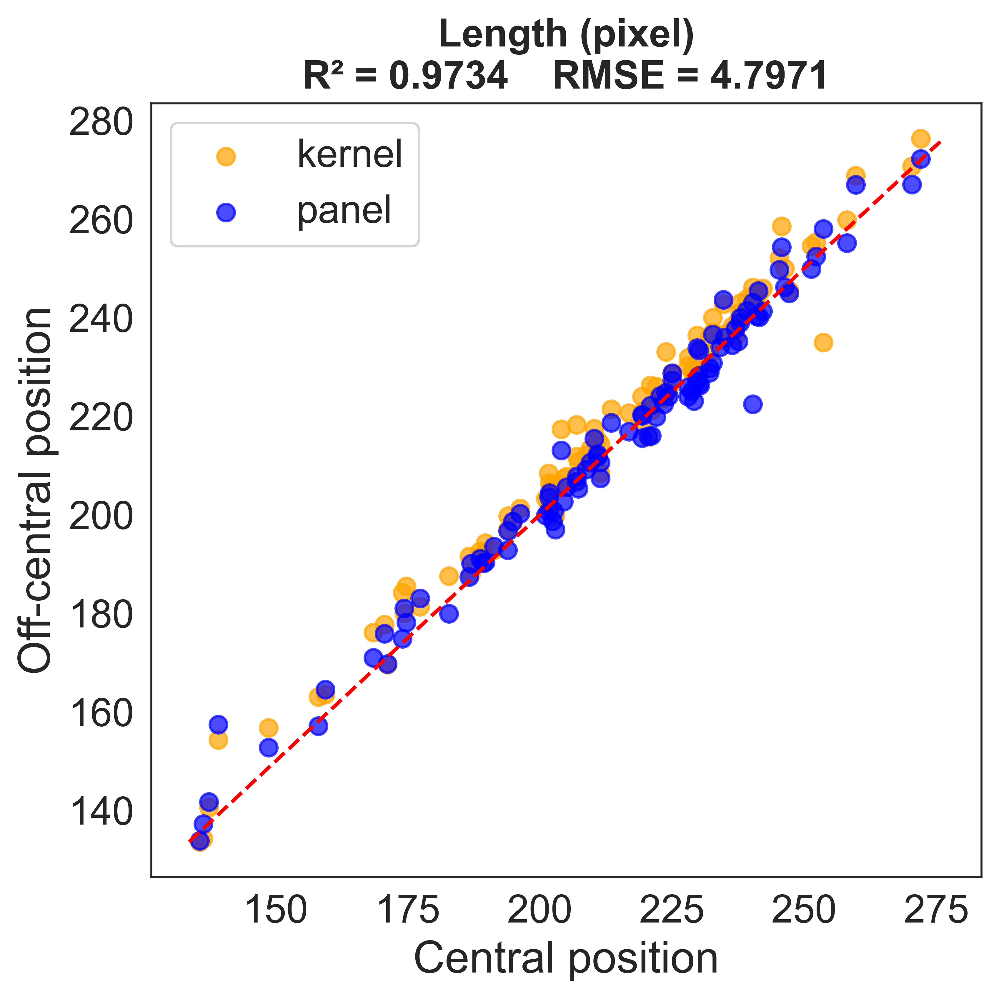

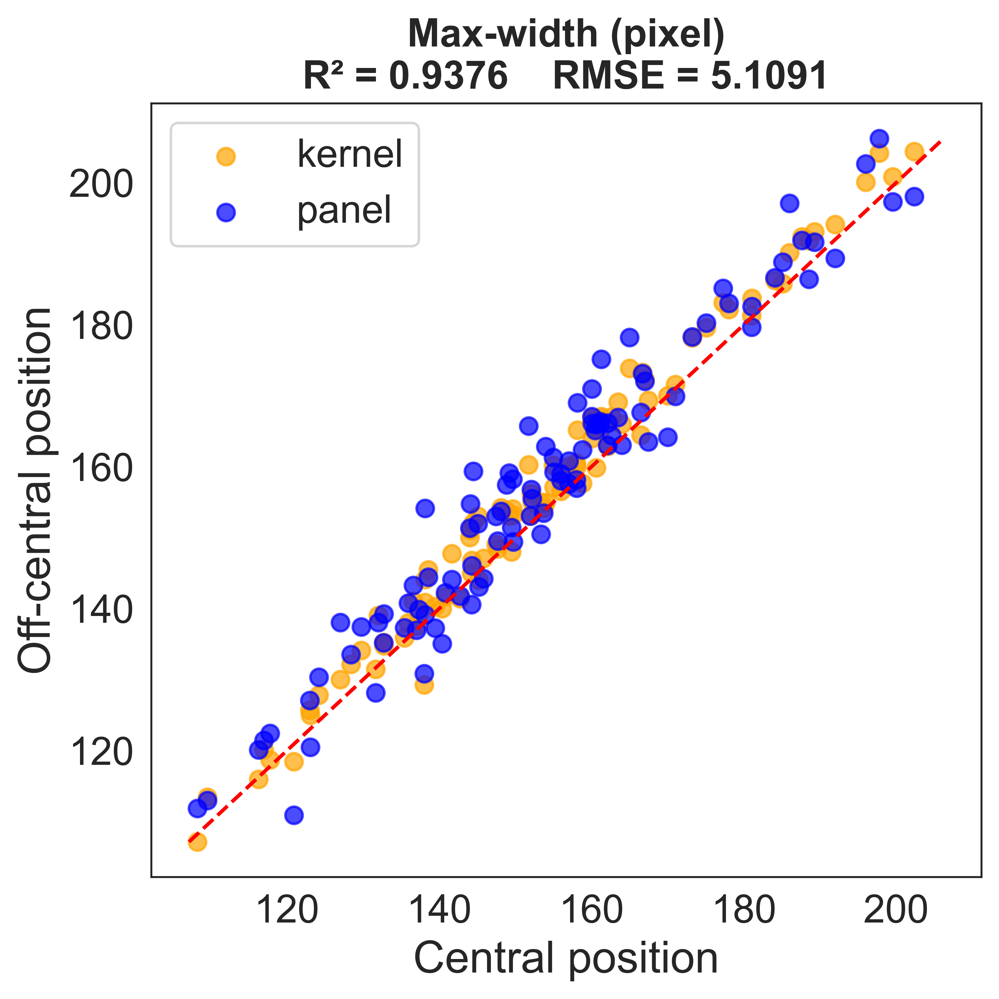

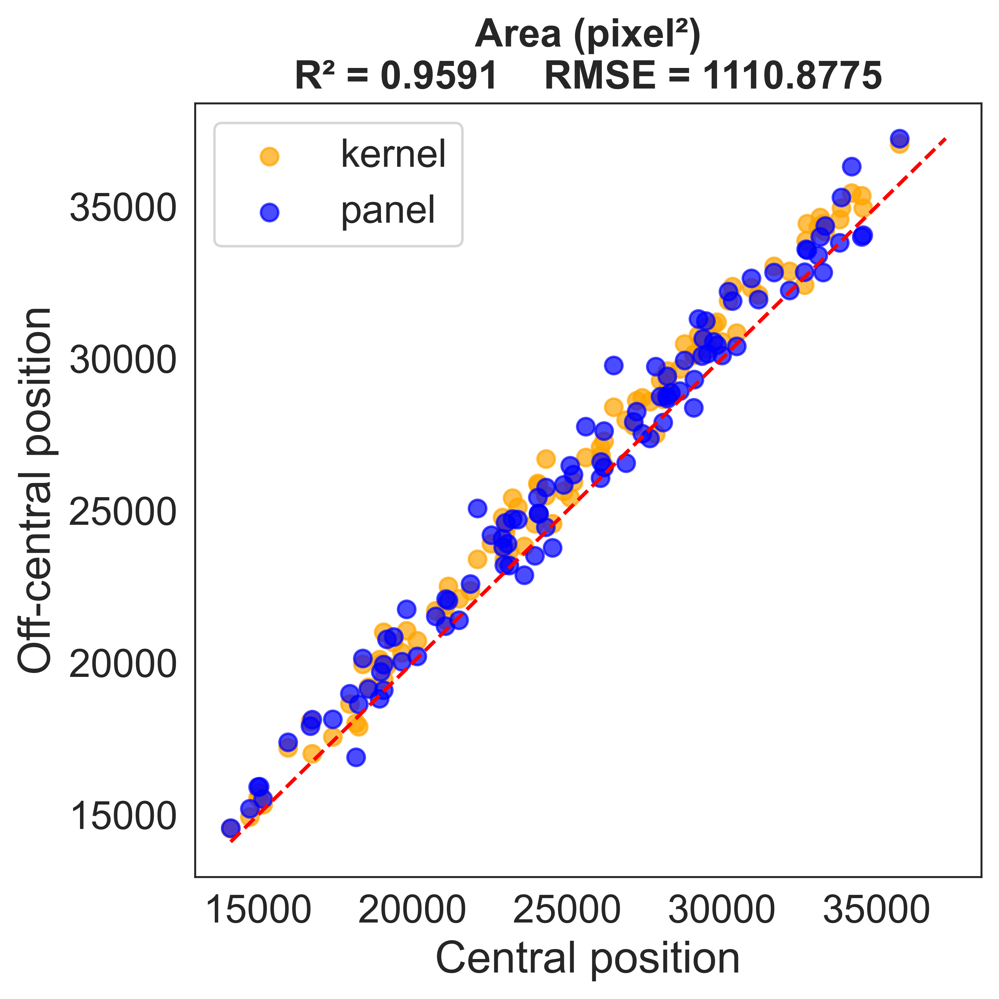

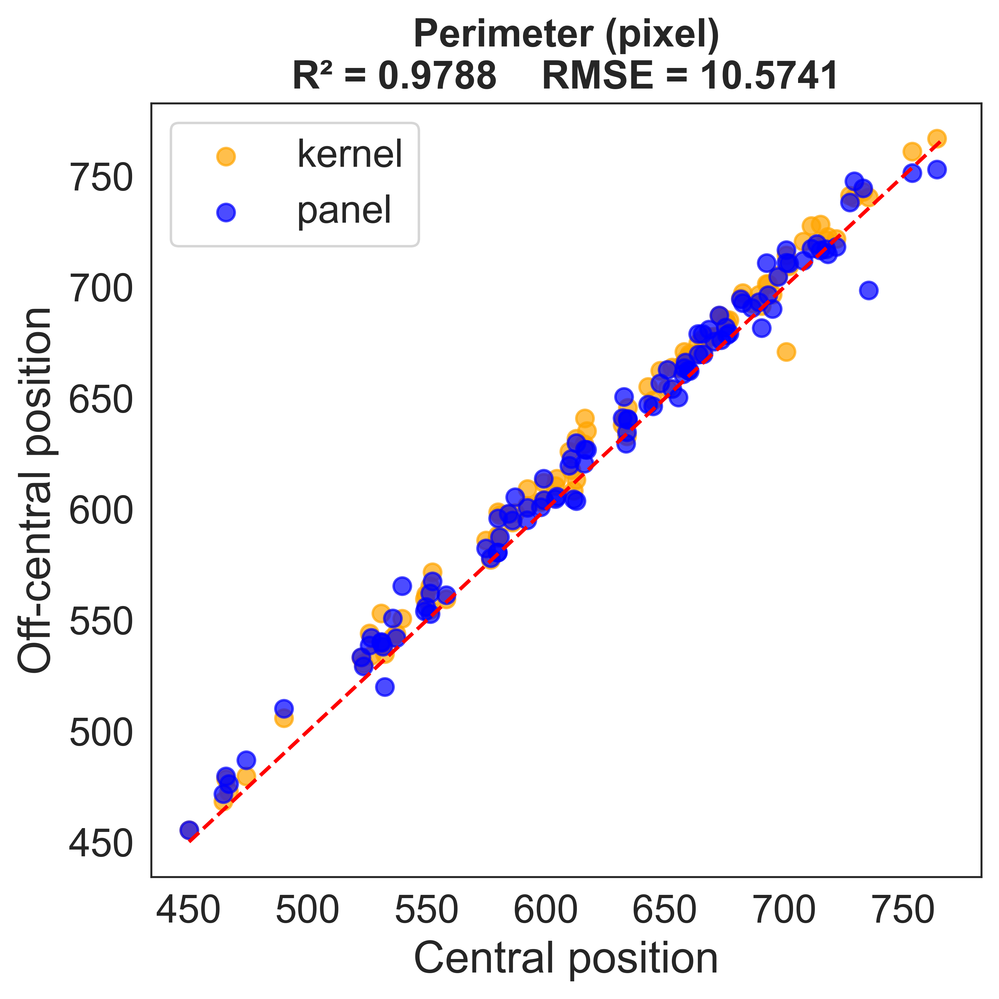

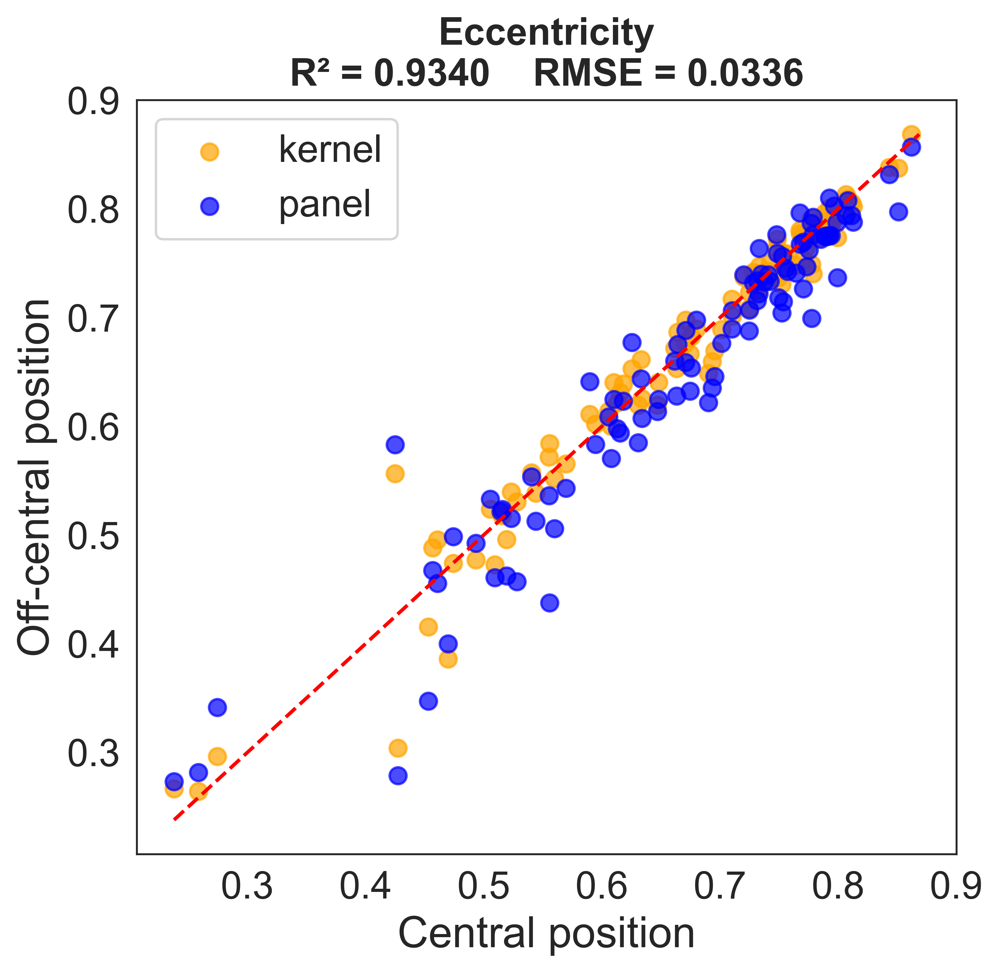

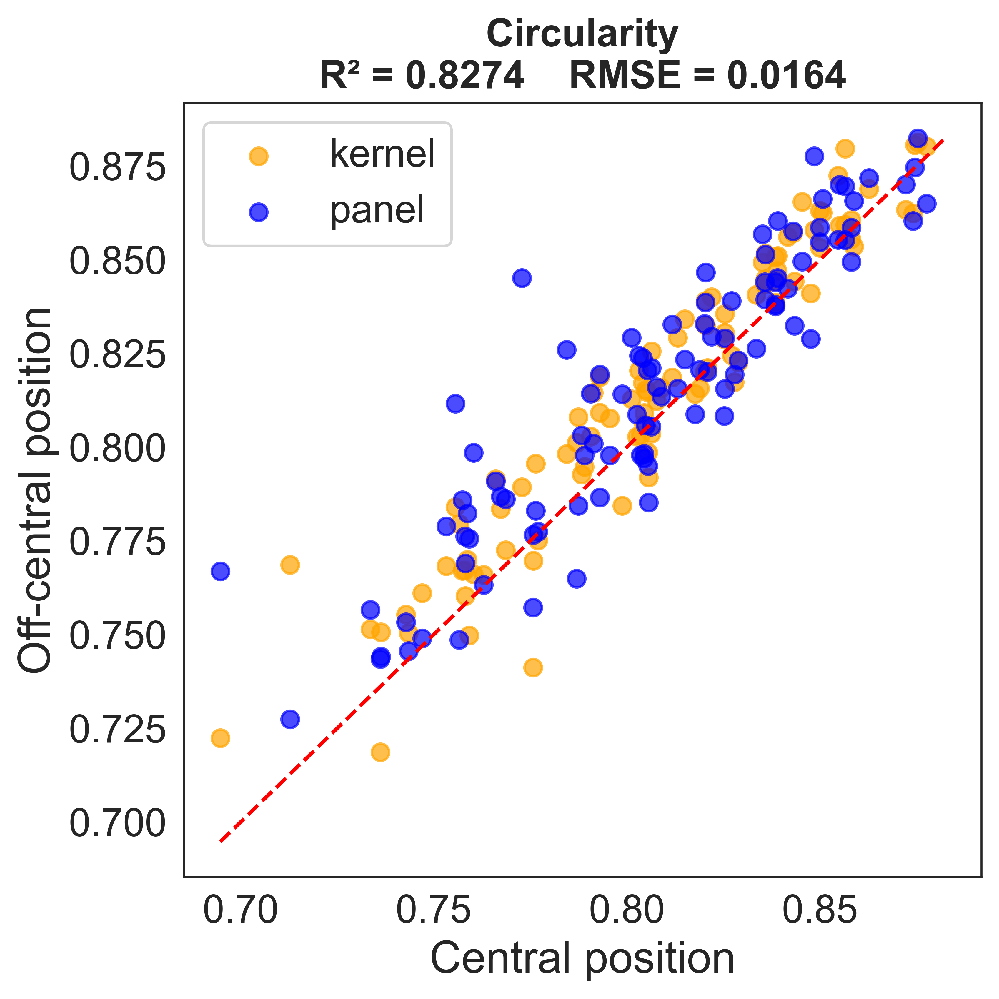

In [11]:
trait_labels = {
    "length_px": "Length (pixel)",
    "max_width_px": "Max-width (pixel)",
    "area_px2": "Area (pixel²)",
    "perimeter_px": "Perimeter (pixel)",
    "eccentricity": "Eccentricity",
    "circularity": "Circularity"
}

save_dir = Path("R2_plots")
save_dir.mkdir(exist_ok=True)

sns.set_style("white")

for trait in traits:

    y_true = result_dict[trait]["y_true"]
    y_pred = result_dict[trait]["y_pred"]
    rep = result_dict[trait]["rep"]

    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    fig, ax = plt.subplots(figsize=(6,6), dpi=600)

    mask_kernel = (rep == "2")
    mask_pannel = (rep == "3")

    ax.scatter(y_true[mask_kernel], y_pred[mask_kernel],
               color='orange', label='kernel', s=50, alpha=0.7)
    ax.scatter(y_true[mask_pannel], y_pred[mask_pannel],
               color='blue', label='panel', s=50, alpha=0.7)

    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val],
            '--', color='red', linewidth=1.5)

    ax.set_xlabel("Central position", fontsize=18)
    ax.set_ylabel("Off-central position", fontsize=18)

    display_name = trait_labels.get(trait, trait)
    ax.set_title(
        f"{display_name}\nR² = {r2:.4f}    RMSE = {rmse:.4f}",
        fontsize=16,
        fontweight='bold'
    )

    ax.legend()

    plt.tight_layout()
    plt.savefig(save_dir / f"{trait}_R2.png", bbox_inches='tight')
    plt.show()
    plt.close()

In [12]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 10),
    dpi=600
)

axes = axes.flatten()

for idx, trait in enumerate(traits):

    ax = axes[idx]

    y_true = result_dict[trait]["y_true"]
    y_pred = result_dict[trait]["y_pred"]
    rep = result_dict[trait]["rep"]

    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    mask_kernel = (rep == "2")
    mask_pannel = (rep == "3")
    ax.scatter(y_true[mask_kernel], y_pred[mask_kernel],
               color='orange', label='kernel', s=40, alpha=0.7)
    ax.scatter(y_true[mask_pannel], y_pred[mask_pannel],
               color='blue', label='panel', s=40, alpha=0.7)

    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val],
            '--r', linewidth=1.5)

    display_name = trait_labels.get(trait, trait)
    ax.set_title(
        f"{display_name}\nR² = {r2:.3f}    RMSE = {rmse:.3f}",
        fontsize=16,
        fontweight='bold'
    )

    ax.set_xlabel("Central position", fontsize=14, fontweight='bold')
    ax.set_ylabel("Off-central position", fontsize=14, fontweight='bold')

    ax.legend(fontsize=10)

for i in range(len(traits), 6):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.savefig("All_Traits_R2.png", bbox_inches='tight')
plt.show()